# Landuse accessibility


Install and update `cityseer` if necessary.


In [1]:
# !pip install --upgrade cityseer

## Data and preparation

This examples calculates landuse accessibility to pubs and restaurants for London

For additional information on network preparation, see the corresponding notebook on [graph cleaning](https://colab.research.google.com/github/cityseer/cityseer/blob/master/demos/graph_cleaning.ipynb).

This example will make use of OSM data downloaded from the [OSM API](https://wiki.openstreetmap.org/wiki/API) for a 5000m radius around London Soho.

The landuse amenity data is taken from `OpenStreetMap` via `osmnx`.


In [2]:
from cityseer.tools import graphs, io

# download from OSM
lng, lat = -0.13396079424572427, 51.51371088849723
buffer = 5000
plot_buffer = 3500
# creates a WGS shapely polygon
poly_wgs, poly_utm, _utm_zone_number, _utm_zone_letter = io.buffered_point_poly(lng, lat, buffer)
plot_bbox = poly_utm.centroid.buffer(plot_buffer).bounds

INFO:cityseer.tools.io:UTM conversion info: UTM zone number: 30, UTM zone letter: U


Prepare the amenities GeoDataFrame.


In [3]:
# prepare data layer
from cityseer.metrics import layers
from osmnx import features

data_gdf = features.features_from_place("london", tags={"amenity": ["pub", "restaurant"]})
data_gdf = data_gdf.to_crs(32630)  # to match EPSG code for UTM zone 30N per network data
data_gdf = data_gdf.loc["node"]
data_gdf = data_gdf.reset_index(level=0, drop=True)
data_gdf.index = data_gdf.index.astype(str)
# convert to the same UTM CRS as the network
data_gdf = data_gdf[["amenity", "geometry"]]
print(data_gdf.head())

      amenity                        geometry
0         pub  POINT (694282.233 5720372.951)
1  restaurant  POINT (694353.653 5720508.222)
2         pub  POINT (694189.282 5720228.905)
3         pub  POINT (695475.171 5721895.793)
4         pub  POINT (709733.415 5720007.168)


Fetch and simplify the street network. The street network will be decomposed for a higher resolution analysis.


In [4]:
# generate OSM graph from polygon
G_utm = io.osm_graph_from_poly(poly_wgs, simplify=True, remove_parallel=True, iron_edges=True)
# decompose for higher resolution analysis
G_decomp = graphs.nx_decompose(G_utm, 25)
# prepare the data structures
nodes_gdf, _edges_gdf, network_structure = io.network_structure_from_nx(G_decomp, crs=32629)

INFO:cityseer.tools.io:Converting networkX graph from EPSG code 4326 to EPSG code 32630.
INFO:cityseer.tools.io:Processing node x, y coordinates.
100%|██████████| 152862/152862 [00:00<00:00, 468521.19it/s]
INFO:cityseer.tools.io:Processing edge geom coordinates, if present.
100%|██████████| 166303/166303 [00:00<00:00, 925798.56it/s]
INFO:cityseer.tools.graphs:Generating interpolated edge geometries.
100%|██████████| 166303/166303 [00:04<00:00, 37097.13it/s]
INFO:cityseer.tools.graphs:Removing filler nodes.
100%|██████████| 152862/152862 [00:19<00:00, 7805.17it/s]
INFO:cityseer.tools.graphs:Removing dangling nodes.
100%|██████████| 43118/43118 [00:00<00:00, 309404.99it/s]
INFO:cityseer.tools.graphs:Removing filler nodes.
100%|██████████| 40276/40276 [00:00<00:00, 71137.77it/s]
INFO:cityseer.tools.util:Creating nodes STR tree
100%|██████████| 38252/38252 [00:00<00:00, 116527.48it/s]
INFO:cityseer.tools.graphs:Consolidating nodes.
100%|██████████| 38252/38252 [00:16<00:00, 2261.68it/s]
IN

In [5]:
# compute pub accessibility - this should take around 5 - 6 minutes depending on resources
distances = [100, 200, 400, 800]
nodes_gdf, pubs_data_gdf = layers.compute_accessibilities(
    data_gdf,
    landuse_column_label="amenity",
    accessibility_keys=["pub", "restaurant"],
    nodes_gdf=nodes_gdf,
    network_structure=network_structure,
    distances=distances,
)

INFO:cityseer.metrics.layers:Computing land-use accessibility for: pub, restaurant
100%|██████████| 94508/94508 [03:14<00:00, 487.08it/s]



    Avg walking tolerance: 35.12m
    Beta: 0.040 (spatial impedance factor)
    Max walking tolerance: 100m
    

        Distance weighted accessibility to amenity of type pub:


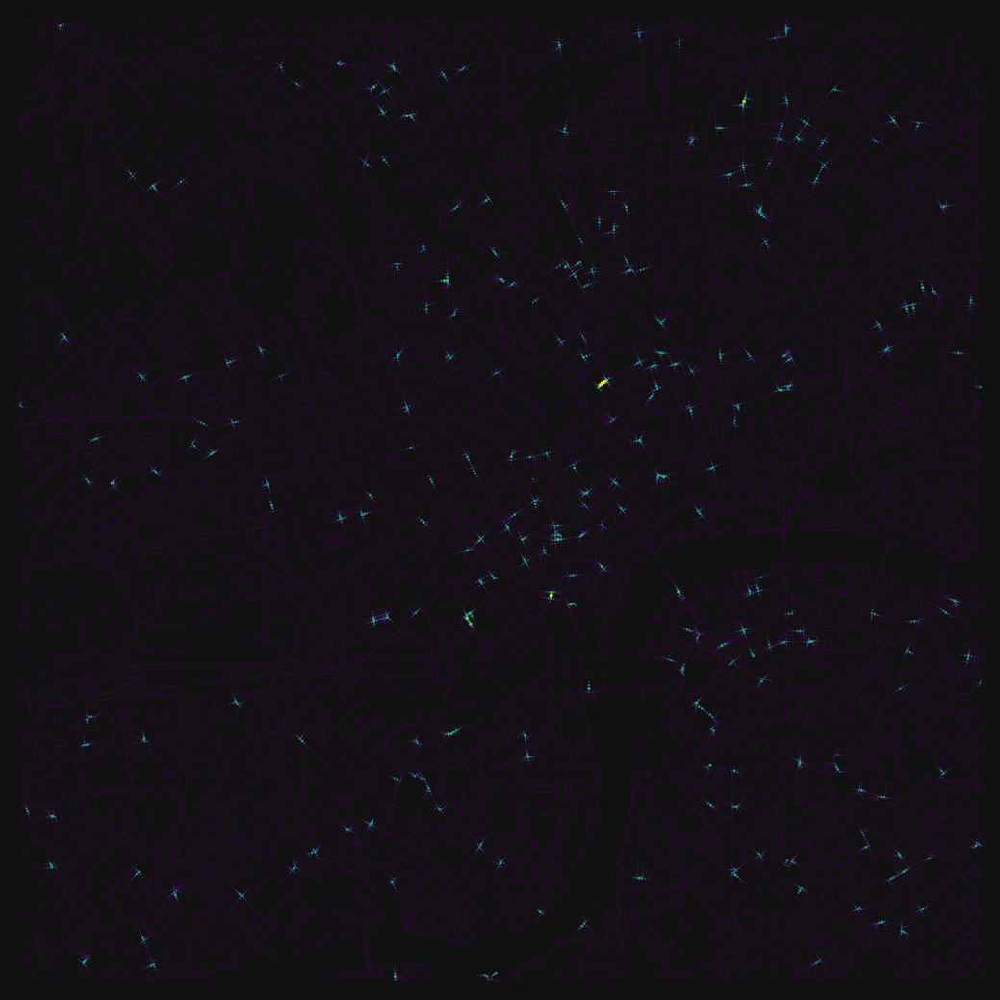


        Distance weighted accessibility to amenity of type restaurant:


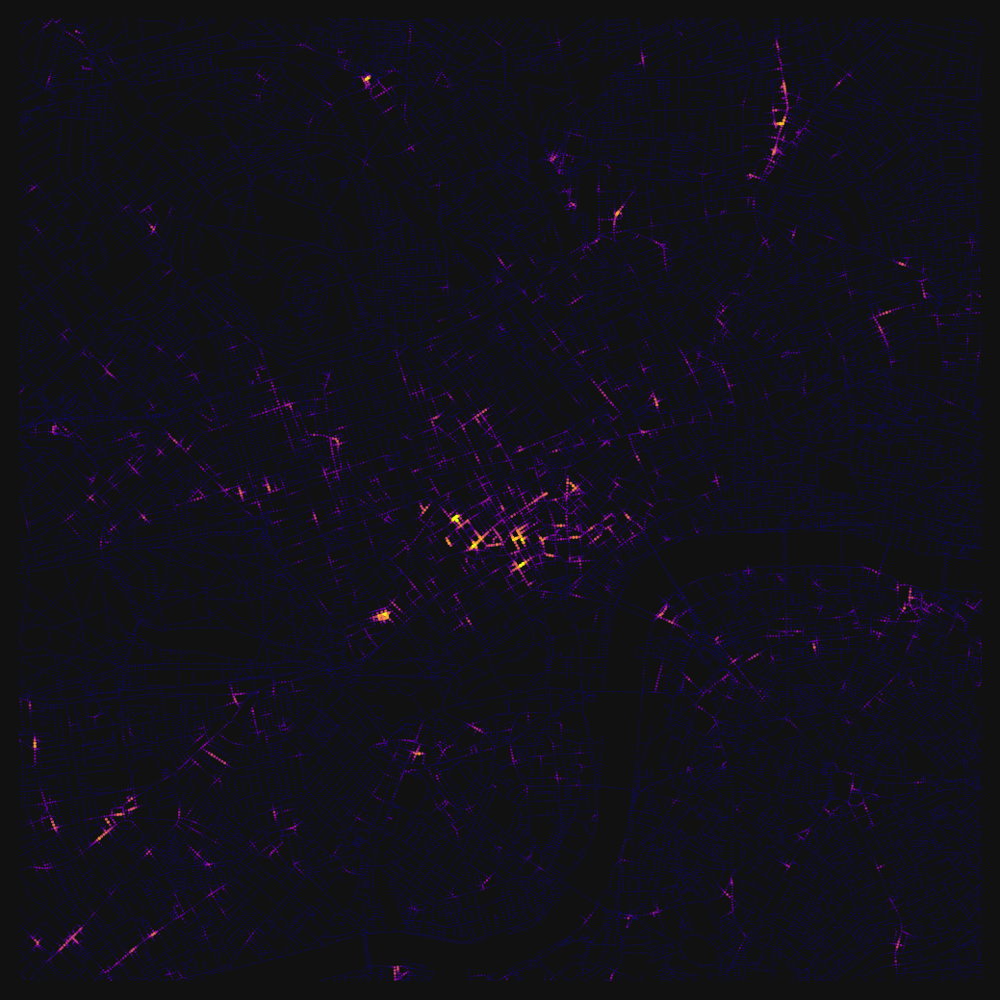


    Avg walking tolerance: 70.24m
    Beta: 0.020 (spatial impedance factor)
    Max walking tolerance: 200m
    

        Distance weighted accessibility to amenity of type pub:


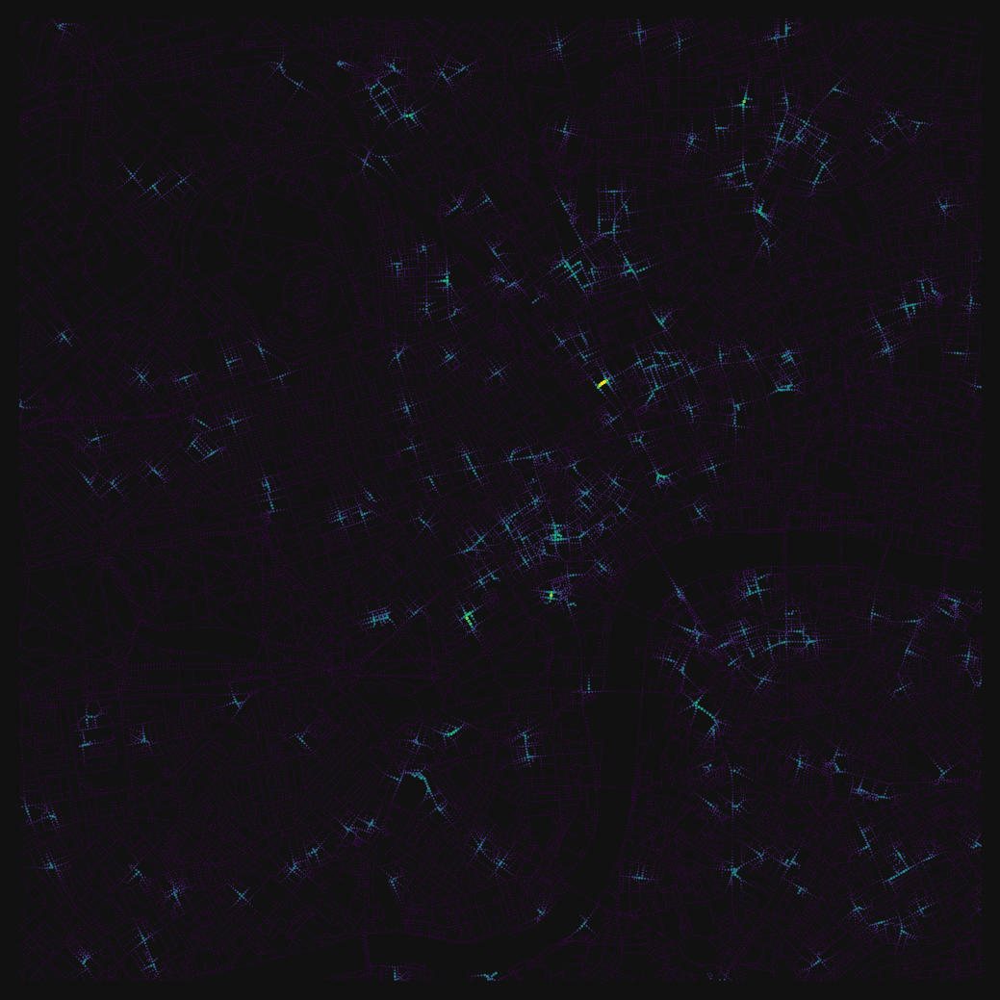


        Distance weighted accessibility to amenity of type restaurant:


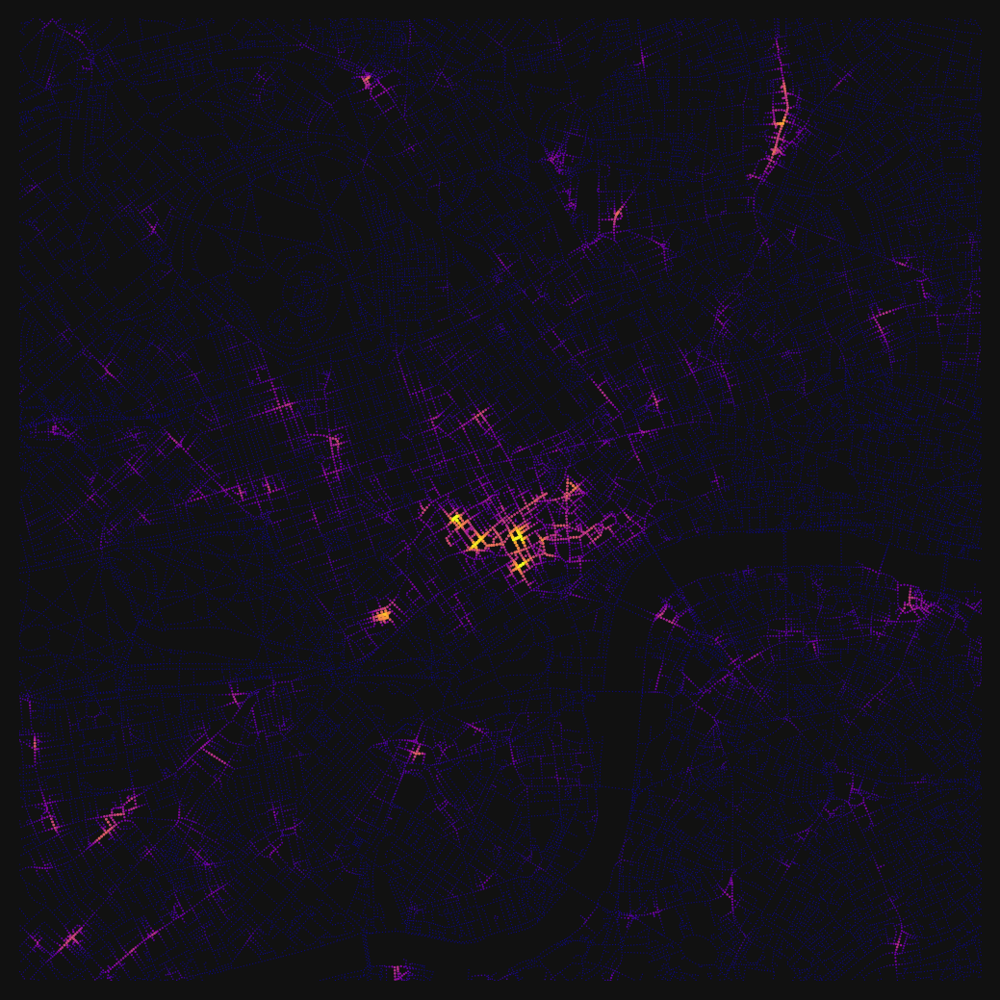


    Avg walking tolerance: 140.48m
    Beta: 0.010 (spatial impedance factor)
    Max walking tolerance: 400m
    

        Distance weighted accessibility to amenity of type pub:


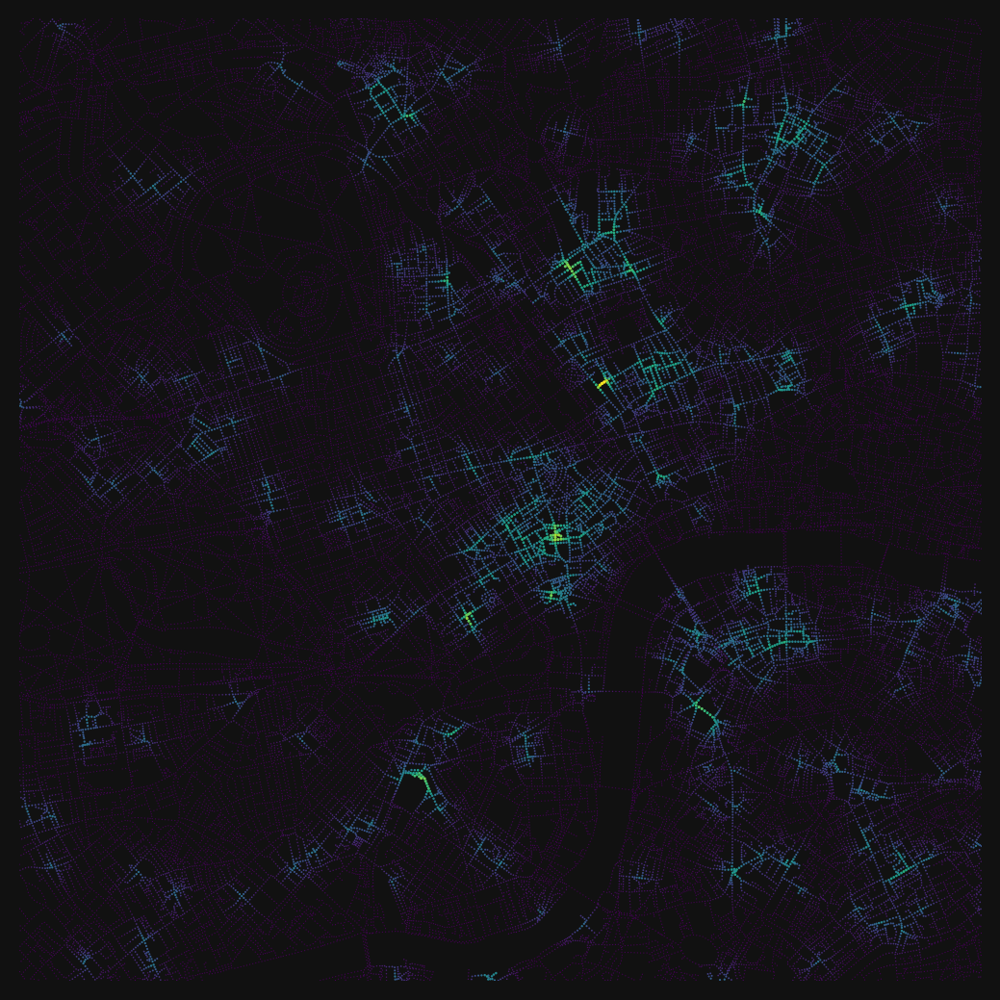


        Distance weighted accessibility to amenity of type restaurant:


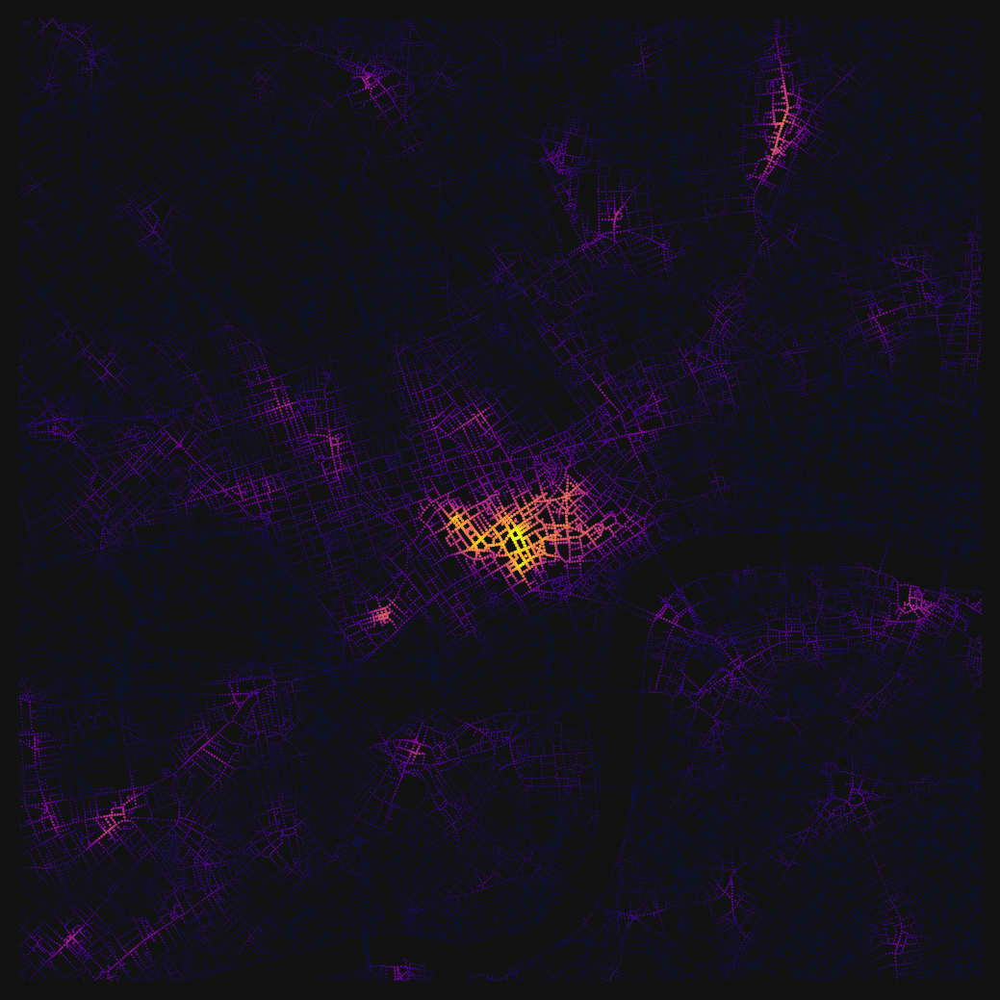


    Avg walking tolerance: 280.96m
    Beta: 0.005 (spatial impedance factor)
    Max walking tolerance: 800m
    

        Distance weighted accessibility to amenity of type pub:


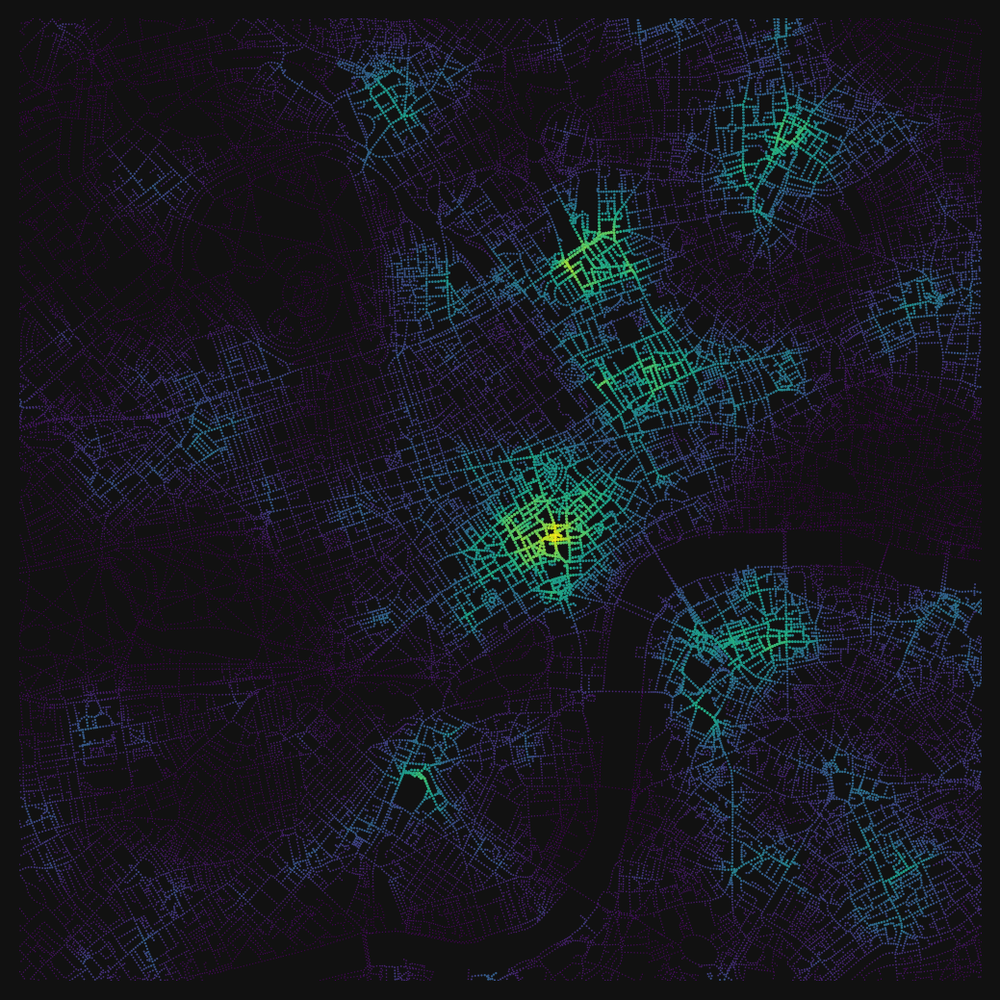


        Distance weighted accessibility to amenity of type restaurant:


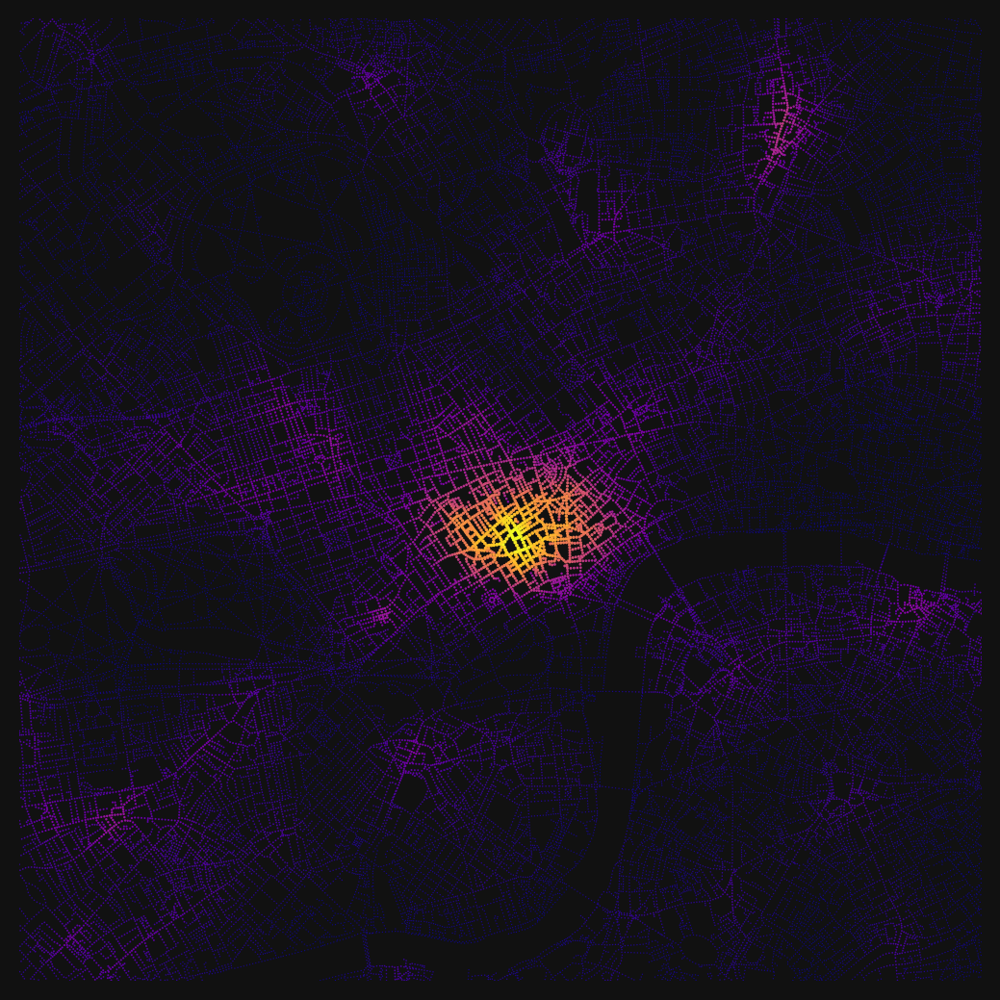

In [6]:
import matplotlib.pyplot as plt
from cityseer import rustalgos
from cityseer.tools import plot

betas = rustalgos.betas_from_distances(distances)
avg_dists = rustalgos.avg_distances_for_betas(betas)
for d, b, avg_d in zip(distances, betas, avg_dists):
    print(
        f"""
    Avg walking tolerance: {avg_d:.2f}m
    Beta: {b:.3f} (spatial impedance factor)
    Max walking tolerance: {d}m
    """
    )
    for amenity, cmap in zip(["pub", "restaurant"], ["viridis", "plasma"]):
        print(
            f"""
        Distance weighted accessibility to amenity of type {amenity}:"""
        )
        bg_colour = "#111"
        fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200, facecolor=bg_colour)
        fig.subplots_adjust(0, 0, 1, 1)
        plot.plot_scatter(
            ax,
            network_structure.node_xs,
            network_structure.node_ys,
            nodes_gdf[f"cc_metric_{amenity}_{d}_weighted"],
            bbox_extents=plot_bbox,
            cmap_key=cmap,
            s_min=0.2,
            s_max=2,
            face_colour=bg_colour,
        )
        plt.show()